<a href="https://colab.research.google.com/github/entc-17-fyp-20/CM_Normal_Behaviour_Modeling/blob/samal/Testing_CNN_with_threshold_selection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
#@title Select Canada dataset for testing { display-mode: "form" }
turbine = 'T22' #@param ["T22","T34","T54","T01","T02","T03","T09","T40"]
model = 'CNN2' #@param ["CNN1","CNN2"]
version =  5#@param {type:"integer"}
split = 0.2 #@param {type:"slider", min:0.025, max:0.9, step:0.025}



# Import libraries and datasets

In [3]:
# multivariate data preparation
from numpy import array, hstack
import pandas as pd
import numpy as np
from datetime import datetime
from math import sqrt

from sklearn import preprocessing
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import Pipeline
from sklearn.base import BaseEstimator, TransformerMixin

from keras.models import Sequential, load_model
from keras.layers import Dense, Flatten, BatchNormalization, Dropout, LocallyConnected2D, LeakyReLU, ReLU
from keras.metrics import mean_squared_error
from keras.layers.convolutional import Conv2D

import plotly.graph_objects as go

In [4]:
features = ['Ambient_Temperature', 'Active_Power','Wind_Speed','Generator_RPM','Gear_Oil_Tempeature']
path = '/content/drive/MyDrive/T1-T3_stats.csv'
statistics = pd.read_csv(path)
statistics = statistics.set_index(statistics['Unnamed: 0'])
statistics.drop('Unnamed: 0', inplace=True, axis=1)

In [5]:
# split a multivariate sequence into samples
def split_sequences(sequences, n_steps):
	X, y = list(), list()
	for i in range(len(sequences)):
		# find the end of this pattern
		end_ix = i + n_steps
		# check if we are beyond the dataset
		if end_ix > len(sequences):
			break
		# gather input and output parts of the pattern
		seq_x, seq_y = sequences[i:end_ix, :-1], sequences[end_ix-1, -1]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
def maxmin(x, ftr):
	stat = statistics.loc[ftr,:]
	x = (x-stat['min'])/(stat['max']-stat['min'])	 
	return x
 
n_steps = 144 #one day

In [6]:
path = '/content/drive/MyDrive/Merged/' + turbine + '.csv'
df = pd.read_csv(path)
# df['Date_Time'] = pd.to_datetime(df['Date_Time'], format="%Y-%m-%d %H:%M:%S")

In [7]:
#@title Select scaling method { display-mode: "form" }
method = 'MinMax' #@param ["Normalize", "MinMax"]

df_time = pd.DataFrame(df["Date_Time"], columns=['Date_Time'])
df.drop("Date_Time", axis='columns', inplace=True)
column_names = df.columns

if method == "Normalize":
  d = preprocessing.normalize(df, axis=0)
  df = pd.DataFrame(d, columns=column_names)
else:
  # scaler = preprocessing.MinMaxScaler()
  # d = scaler.fit_transform(df)
  for ftr in features:
    df[ftr] = df[ftr].apply(lambda row : maxmin(row, ftr))

df["Date_Time"] = df_time["Date_Time"]
df = df.set_index(df['Date_Time'])

# Creating test set

In [8]:
n_features = 4

format = '%Y-%m-%d %H:%M:%S'
split_index=[];
split_index.append(df['Date_Time'][0])
for i in range(0,len(df['Date_Time'])-1):
  current_time =  df['Date_Time'][i]
  following_time=  df['Date_Time'][i+1]
  time_gap =datetime.strptime(following_time, format)-datetime.strptime(current_time, format)
  if (time_gap.total_seconds() != 600):
    split_index.append(current_time)
    split_index.append(following_time)
split_index.append(df['Date_Time'][len(df['Date_Time'])-1])

df = df.set_index(df['Date_Time'])

In [9]:
if model == "CNN1":
  l = ['Ambient_Temperature', 'Active_Power','Wind_Speed','Generator_RPM','Generator_Bearing_Tempeature']
elif model == "CNN2":
  l = ['Ambient_Temperature', 'Active_Power','Wind_Speed','Generator_RPM','Gear_Oil_Tempeature'] 
# change feature order and test the model.

In [10]:
y_concat_test, X_concat_test = [],[]

for i in range(0,len(split_index),2):
  dfx = df[split_index[i]:split_index[i+1]]
  if len(dfx)>=144:
    dfx = dfx[l]
    dfx = dfx.to_numpy()
    # convert into input/output
    X, y = split_sequences(dfx, n_steps)
    X_concat_test.append(X)
    y_concat_test.append(y)

X_concat_test = tuple(X_concat_test)
y_concat_test = tuple(y_concat_test)

In [11]:
# Concatenating datasets
X_test = np.concatenate(X_concat_test)
y_test = np.concatenate(y_concat_test)

X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],X_test.shape[2],1))

# Model
*Only for model versions upto 4*

In [12]:
def create_model():
# define model
  model1 = Sequential()
  model1.add(Conv2D(filters=128, kernel_size=(32,4), padding="same", input_shape=(n_steps, n_features,1)))
  model1.add(BatchNormalization())
  # model1.add(ReLU())
  model1.add(Dropout(0.1))
  model1.add(Conv2D(filters=128, kernel_size=(18,4), padding="same"))
  model1.add(BatchNormalization())
  # model1.add(ReLU())
  model1.add(Dropout(0.1))
  model1.add(Conv2D(filters=128, kernel_size=(8,4), padding="same"))
  model1.add(BatchNormalization())
  # model1.add(ReLU())
  model1.add(Dropout(0.1))
  model1.add(Conv2D(filters=128, kernel_size=(8,4), padding="same"))
  model1.add(BatchNormalization())
  # model1.add(ReLU())
  model1.add(Dropout(0.1))
  model1.add(LocallyConnected2D(filters=10, kernel_size=(8, 4), activation="relu"))
  model1.add(Flatten())
  model1.add(Dense(20, activation='relu'))
  model1.add(Dense(1))
  # model1.add(LeakyReLU(alpha=0.1))
  model1.compile(optimizer='adam', loss='mse') #, metrics=['mse', 'mae', 'mape']
  return model1

# Load the model

In [13]:
#loading the model
model_number = str(model) + "." + str(version)

if version>4:
  path = '/content/drive/MyDrive/Machine Learning Models/FYP/' + model_number + '/model.h5' #loading both model and weights
  model = load_model(path)
else:
  path = '/content/drive/MyDrive/Machine Learning Models/FYP/' + model_number + '/' #loading only weights
  # Create a new model instance
  model = create_model()
  # Restore the weights
  model.load_weights(path)

#Testing on the original model

In [14]:
# prediction
yhat = model.predict(X_test, verbose=1)
yhat = yhat.reshape(yhat.shape[0],)
df_final=pd.DataFrame({'y_hat':yhat,'y_test':y_test})

2103/2103 [==============================] - 136s 60ms/step


In [15]:
# Evaluation
df_final['difference'] = df_final['y_hat']-df_final['y_test']
df_final["abs_difference"] = abs(df_final['y_hat']-df_final['y_test'])
print("Difference " + str(df_final["difference"].mean()))
print("Absolute difference " + str(df_final["abs_difference"].mean()))
print("Mean squared error " + str(np.sqrt(mean_squared_error(df_final['y_test'].values, df_final['y_hat'].values))))

Difference 0.0577787015724409
Absolute difference 0.09258303014254103
Mean squared error 0.11898255


 Plots

In [16]:
# Adding data_time column back
frames = []

for i in range(0,len(split_index),2):
  dfx = df[split_index[i]:split_index[i+1]]
  frames.append(dfx.iloc[n_steps-1:,:])

test = pd.concat(frames)
test.drop("Date_Time", axis='columns', inplace=True)
test = test.reset_index()
df_final["Date_Time"] = test["Date_Time"]

In [17]:
column_name = 'y_test' 
column_name1 = 'y_hat'

fig = go.Figure()
fig.add_trace(go.Scatter(x=df_final['Date_Time'], y=df_final[column_name], mode='lines', name='Actual'))
fig.add_trace(go.Scatter(x=df_final['Date_Time'],y=df_final[column_name1], mode='lines', name='Predicted'))
fig.update_layout(title_text= "Actual vs Predicted",)

fig.show()

In [18]:
#@title Two variables in two figures { display-mode: "form" }
column_name = 'y_test' #@param ["y_test"]
column_name1 = 'y_hat' #@param ["y_hat"]

unit1 = column_name.split()[-1]
unit2 = column_name1.split()[-1]
# unit3 = column_name2.split()[-1]

# Create figure
fig = go.Figure()

fig.add_trace(
    go.Scatter(x=list(df_final['Date_Time']), y=list(df_final[column_name]), name=column_name, yaxis="y"))

fig.add_trace(
    go.Scatter(x=list(df_final['Date_Time']), y=list(df_final[column_name1]), name=column_name1, yaxis="y2"))

# Set title
fig.update_layout(
    title_text= column_name + " vs "+ column_name1
)

# Add range slider
fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=30,
                     label="30m",
                     step="minute",
                     stepmode="backward"),
                dict(count=1,
                     label="1h",
                     step="hour",
                     stepmode="backward"),
                dict(count=6,
                     label="6h",
                     step="hour",
                     stepmode="backward"),
                dict(count=1,
                     label="1d",
                     step="day",
                     stepmode="backward"),
                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    ),
    yaxis=dict(
        anchor="x",
        autorange=True,
        domain=[0, 0.45],
        linecolor="#673ab7",
        mirror=True,
        showline=True,
        side="left",
        tickfont={"color": "#673ab7"},
        tickmode="auto",
        ticks="",
        title=unit1,
        titlefont={"color": "#673ab7"},
        type="linear",
        zeroline=False
    ),
    yaxis2=dict(
        anchor="x",
        autorange=True,
        domain=[0.55, 1],
        linecolor="#795548",
        mirror=True,
        showline=True,
        side="left",
        tickfont={"color": "#795548"},
        tickmode="auto",
        ticks="",
        title=unit2,
        titlefont={"color": "#795548"},
        type="linear",
        zeroline=False
    )
)

# Update layout
fig.update_layout(
    dragmode="zoom",
    hovermode="x",
    legend=dict(traceorder="reversed"),
    height=600,
    template="plotly_white",
    margin=dict(
        t=100,
        b=100
    ),
)

fig.show()

In [19]:
column_name = 'difference' 

fig = go.Figure()
fig.add_trace(go.Scatter(x=df_final['Date_Time'], y=df_final[column_name], mode='lines', name='Error'))
fig.update_layout(title_text= "Error", yaxis_range=[-1,2])

fig.show()

In [20]:
column_name = 'abs_difference' 

fig = go.Figure()
fig.add_trace(go.Scatter(x=df_final['Date_Time'], y=df_final[column_name], mode='lines', name='Absolute Error'))
fig.update_layout(title_text= "Absolute Error")

fig.show()

In [21]:
#@title Resampling { display-mode: "form" }
sample_frequency = 60 #@param {type:"slider", min:20, max:120, step:10}
sample = str(sample_frequency) + "min"

In [22]:
df_final['Date_Time'] = pd.to_datetime(df_final['Date_Time'], format="%Y-%m-%d %H:%M:%S")
df_final.set_index('Date_Time', inplace = True)
df_resample = df_final.resample(sample).mean().reset_index()
df_final = df_final.reset_index()

In [23]:
column_name = 'difference' 

fig = go.Figure()
fig.add_trace(go.Scatter(x=df_resample['Date_Time'], y=df_resample[column_name], mode='lines', name='Error'))
fig.update_layout(title_text= "Error")

fig.show()

In [24]:
column_name = 'abs_difference' 

fig = go.Figure()
fig.add_trace(go.Scatter(x=df_resample['Date_Time'], y=df_resample[column_name], mode='lines', name='Absolute Error'))
fig.update_layout(title_text= "Absolute Error")

fig.show()

# Threshold Selection

In [88]:
diff = df_final['difference']
normal_diff = diff[12000:14000]
mean = normal_diff.mean()
std =  normal_diff.std()
mean,std

(0.04944032793168746, 0.094018255651455)

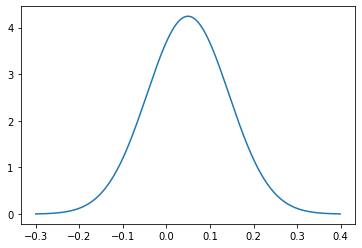

In [95]:

import matplotlib.pyplot as plt
import numpy as np
import scipy.stats as stats
import math

mu = mean
sigma = std
x = np.arange(-0.3,0.4, 0.001)
plt.plot(x, stats.norm.pdf(x, mu, sigma))
plt.show()

In [90]:

import scipy.stats as st
  
st.t.interval(alpha=0.99,
              df=len(normal_diff)-1,
              loc=np.mean(normal_diff), 
              scale=st.sem(normal_diff))

(0.04401995550436296, 0.054860700359011964)

## Calculate the cumulative probability of error lying between -0.25 and 0.25

In [104]:
import scipy.stats

confidence_level = (scipy.stats.norm(mean, std).cdf(0.25)- scipy.stats.norm(mean, std).cdf(-0.25))*100
confidence_level

99.60497985688195

Thresold = 0.3